# Parking Spot Detection

# Submission details
### Name: Anshul Aggarwal
### ID: 24231656
### Class code: EE551

In [1]:
# install required libraries
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import os
import random

from scipy import ndimage, misc, signal
%matplotlib inline


In [2]:
# Function to plot images
def plot_images(img_list, gray=False):
    '''
    Input:
    img_list -> List of images
    gray -> Boolean indicating if images are grayscale

    Plots all the given images within a single frame
    '''
    for i in range(len(img_list)):

        # Calculate individual widths for each subplot based on aspect ratio
        aspect_ratios = [img.shape[1] / img.shape[0] for img in img_list[i]]  # width/height for each image
        total_aspect_ratio = sum(aspect_ratios)
        fig_width = 15  # Base figure width
        figsize = (fig_width, fig_width / total_aspect_ratio * len(aspect_ratios))
        fig, axes = plt.subplots(
            ncols=len(img_list[i]), 
            figsize=figsize, 
            gridspec_kw={"width_ratios": aspect_ratios}
        )
        axes=axes.ravel()

        # Plot each image in the respective subplot
        for idx,img in enumerate(img_list[i]):
            if gray:
                axes[idx].imshow(img, cmap="gray")
            else:
                axes[idx].imshow(img)
            axes[idx].axis("off")  # Hide axis for better visualization
            #axes[idx].set_aspect('auto')  # Adjust aspect ratio to fill the column
        plt.tight_layout()
        plt.show()

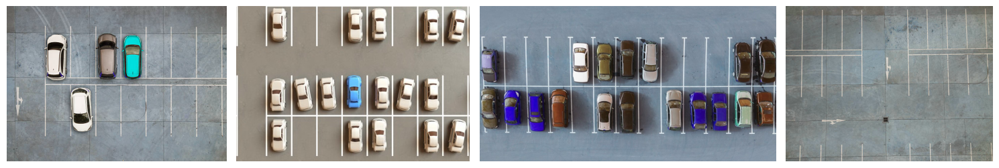

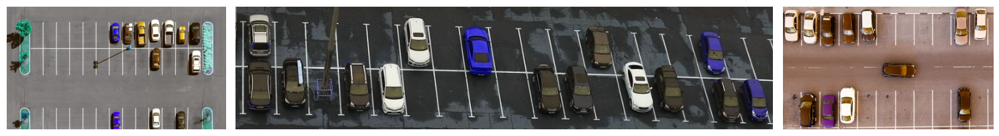

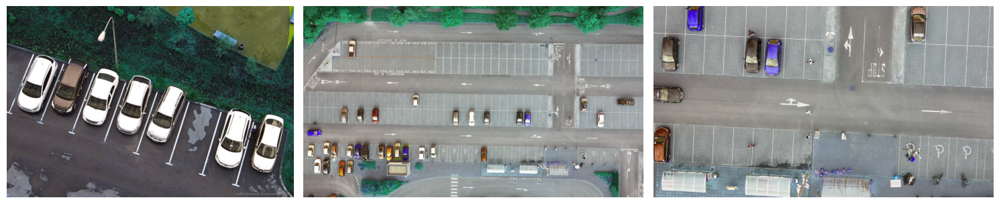

In [3]:
input_path_easy = 'images/easy/'
input_path_medium = 'images/medium/'
input_path_hard = 'images/hard/'
haar_cascade = 'cars.xml'

def get_images(input_path):
    '''
    Input: 
    input_path -> path where images are stored
    
    Returns list of images
    '''
    filenames = [input_path + filename for filename in os.listdir(input_path)]
    return [cv2.imread(filename) for filename in filenames]

raw_images_easy = get_images(input_path_easy)
raw_images_medium = get_images(input_path_medium)
raw_images_hard = get_images(input_path_hard)

raw_images = [raw_images_easy, raw_images_medium, raw_images_hard]
plot_images(raw_images)

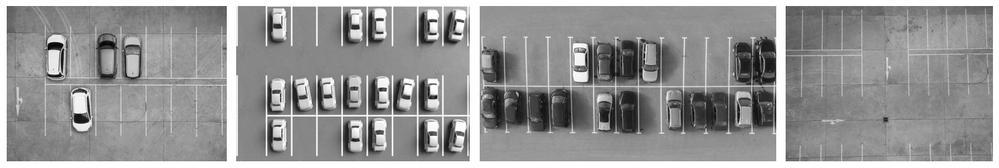

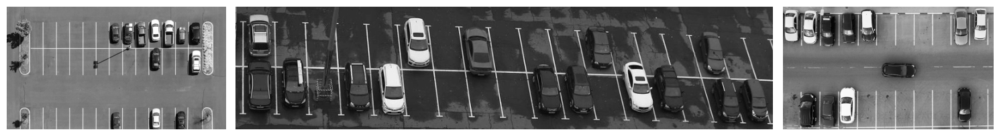

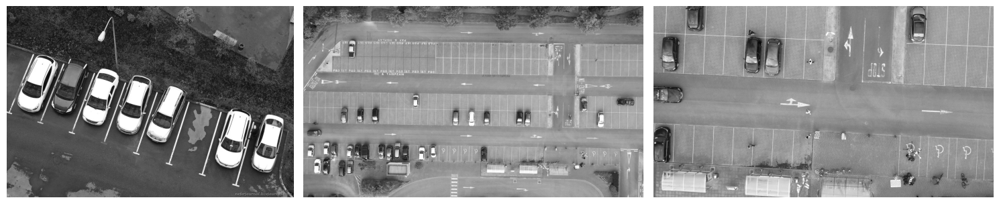

In [4]:
# Function to covert BGR images to grayscale images
def convert_grey(img_list):
    '''
    Input: 
    img_list -> A list of images
    
    Returns list of images converted to grayscale
    '''
    return [cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in img_list]

grey_images_easy = convert_grey(raw_images_easy)
grey_images_medium = convert_grey(raw_images_medium)
grey_images_hard = convert_grey(raw_images_hard)

grey_images = [grey_images_easy, grey_images_medium, grey_images_hard]
plot_images(grey_images, True)

### Preprocessing for detecting Parking spots and areas

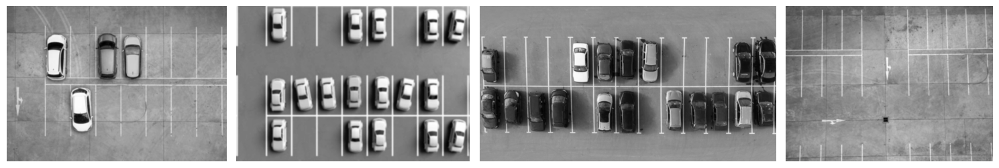

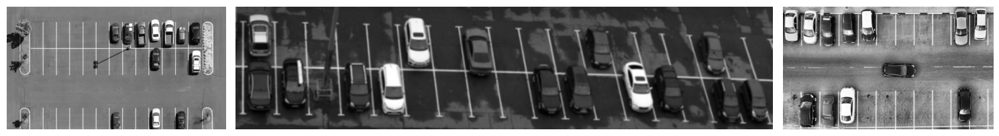

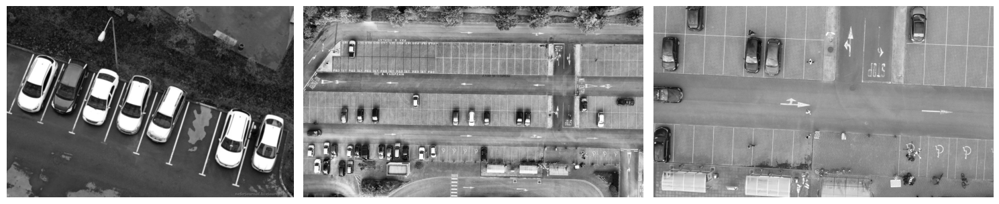

In [5]:
# Function to apply gaussian blur
def blur(img_list, ksize=5, sig=0, diff='easy'):
    '''
    Input:
    img_list -> A list of images
    ksize -> size of kernel matrix (default 5)
    sig -> Sigma value (default 0)
    diff -> distingiushes the difficulty of image set provided
    
    Returns list of images after applying gaussian blur to each of them
    '''
    images = []
    for idx, img in enumerate(img_list):
        if (idx == 2 and diff == 'medium') or (idx == 1 and  diff == 'hard'):
            # applying histogram equilisation to the images that require contrast enhancement
            clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
            blurred = cv2.GaussianBlur(clahe.apply(img), (ksize,ksize), sig)
        else:
            blurred = cv2.GaussianBlur(img, (ksize,ksize), sig)
        images.append(blurred)
    return images # [cv2.GaussianBlur(img, (ksize,ksize), sig) for img in img_list]
    
blur_images_easy = blur(grey_images_easy)
blur_images_medium = blur(grey_images_medium, diff='medium')
blur_images_hard = blur(grey_images_hard, 7, 1,diff='hard')

blur_images = [blur_images_easy, blur_images_medium, blur_images_hard]
plot_images(blur_images, True)

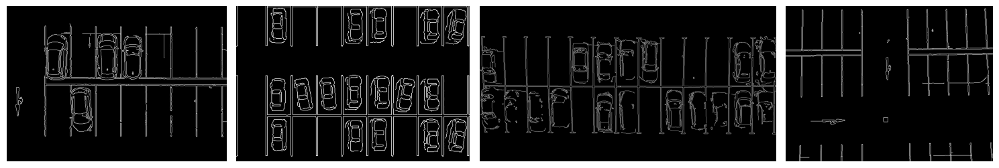

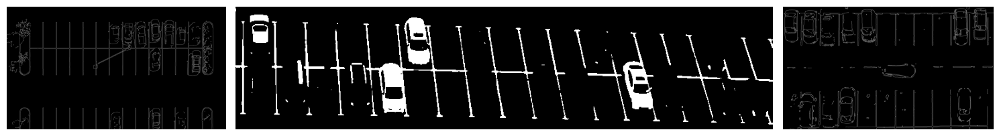

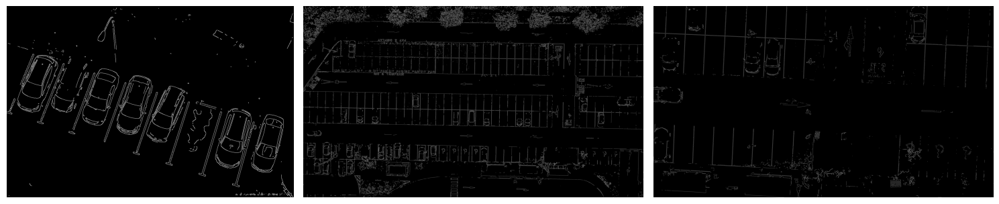

In [7]:
# Function to detect canny edges
def detect_canny_edges(img_list, low_thresh=60, high_thresh=170, diff='easy'):
    '''
    Input: 
    img_list -> A list of images
    low_thresh -> lower threshold value (default 60)
    high_thresh -> Higher threshold value (default 170)
    diff -> distingiushes the difficulty of image set provided
    
    Returns list of images after applying canny edge detection and otsu thresholding
    '''
    images = []
    for idx, img in enumerate(img_list):
        if diff == 'medium' and idx == 1:
            edges = img.copy()
        else:
            edges = cv2.Canny(img, low_thresh, high_thresh)
        _, otsu_thresholded_image = cv2.threshold(edges, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        images.append(otsu_thresholded_image)
    return images # [cv2.Canny(img, low_thresh, high_thresh) for img in img_list]

canny_images_easy = detect_canny_edges(blur_images_easy)
canny_images_medium = detect_canny_edges(blur_images_medium, 150, 255, diff='medium')
canny_images_hard = detect_canny_edges(blur_images_hard, 200, 255)

canny_images = [canny_images_easy, canny_images_medium, canny_images_hard]
plot_images(canny_images, True)

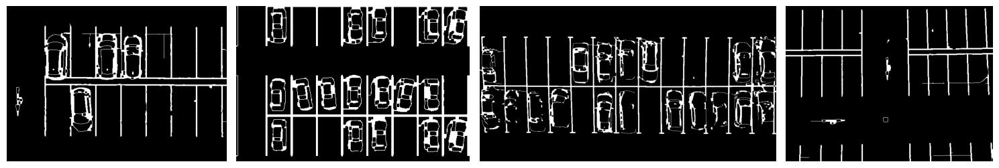

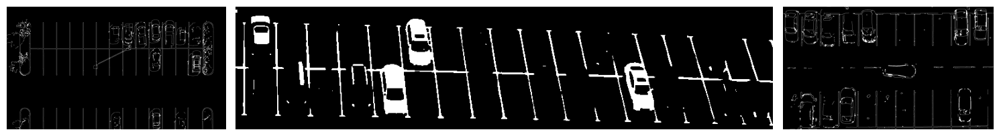

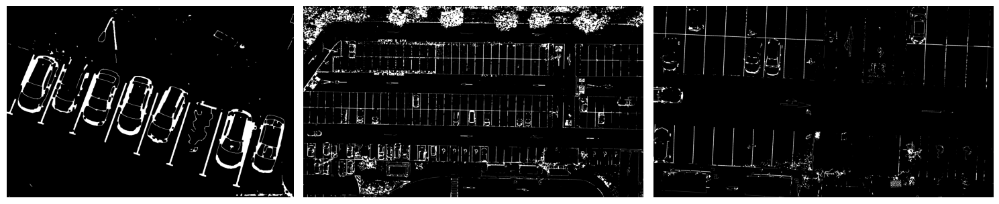

In [8]:
# Function to apply moprpholgy operations (opening, closing, erosion and dilation)
def morph_lines(img_list, open=3, close=3, diff="easy"):
    '''
    Input:
    img_list -> List of binary images
    open -> Minimum number of pixels for an object to remain (opening kernel size)
    close -> closing kernel size
    diff -> distingiushes the difficulty of image set provided
    
    Returns List of images after applying series of morphological operations focused on detecting parking grids
    '''
    images=[]
    # construct a closing and opening kernel
    open_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (open, open))
    close_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (close, close))

    for idx,img in enumerate(img_list):
        opened_image = cv2.morphologyEx(img, cv2.MORPH_OPEN, open_kernel)
        grid = cv2.morphologyEx(opened_image, cv2.MORPH_CLOSE, close_kernel, iterations=2)
        grid = cv2.morphologyEx(grid, cv2.MORPH_OPEN, open_kernel)

        images.append(grid)

    return images

morphed_images_easy = morph_lines(canny_images_easy,1, 3)
morphed_images_medium = morph_lines(canny_images_medium, 1, 2, 'medium')
morphed_images_hard = morph_lines(canny_images_hard, 1, 4)

morphed_images = [morphed_images_easy, morphed_images_medium, morphed_images_hard]
plot_images(morphed_images, True)

### Preprocessing for detecting Cars

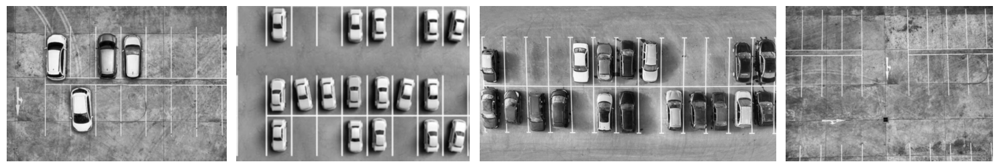

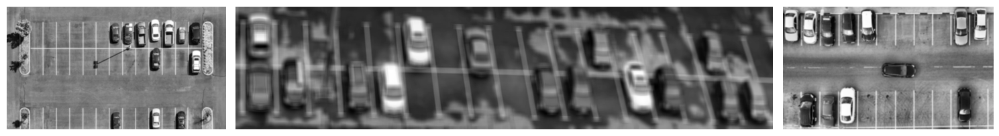

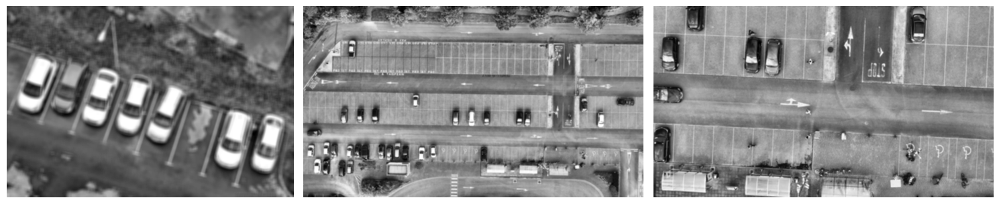

In [6]:
# Function to apply gaussian blur and contrast enhancement
def contrast_blur(img_list, ksize=9, sig=11):
    '''
    Input:
    img_list -> A list of images
    ksize -> size of kernel matrix (default 9)
    sig -> Sigma value (default 11)
    
    Returns list of images after applying histogram equilisation and gaussian blur to each of them
    '''
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    return [cv2.GaussianBlur(clahe.apply(img), (ksize,ksize), sig) for img in img_list]

blur_images_easy2 = contrast_blur(grey_images_easy, 3, 3)
blur_images_medium2 = contrast_blur(grey_images_medium)
blur_images_hard2 = contrast_blur(grey_images_hard, 15, 50)

blur_images2 = [blur_images_easy2, blur_images_medium2, blur_images_hard2]
plot_images(blur_images2, True)

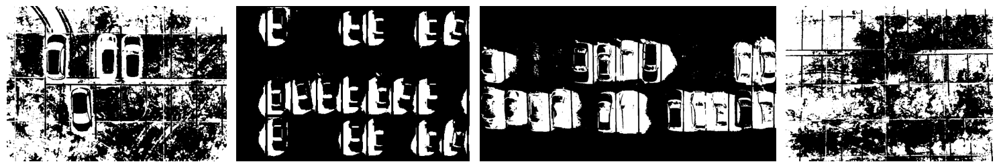

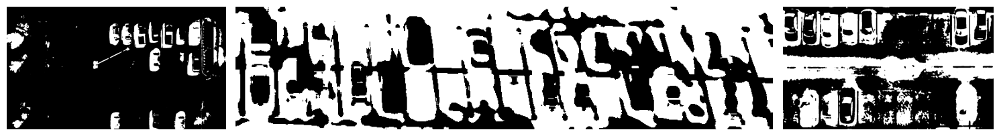

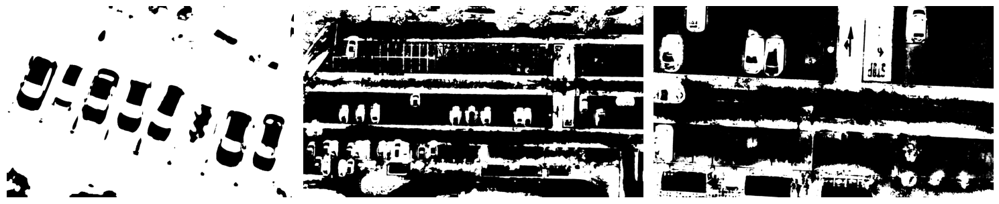

In [9]:
# function to convert the image to binary
def convert_binary(img_list):
    '''
    Input: 
    img_list -> A list of images
    
    Returns list of binary images by applying otsu thresholding
    '''
    images = []
    for img in img_list:
        _, otsu_thresholded_image = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        swapped = cv2.subtract(255, otsu_thresholded_image) 
        images.append(swapped)
    return images

binary_images_easy = convert_binary(blur_images_easy2)
binary_images_medium = convert_binary(blur_images_medium2)
binary_images_hard = convert_binary(blur_images_hard2)

binary_images = [binary_images_easy, binary_images_medium, binary_images_hard]
plot_images(binary_images, True)

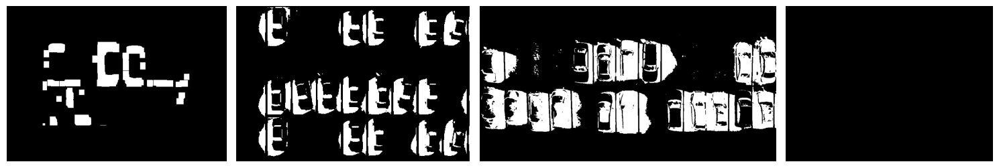

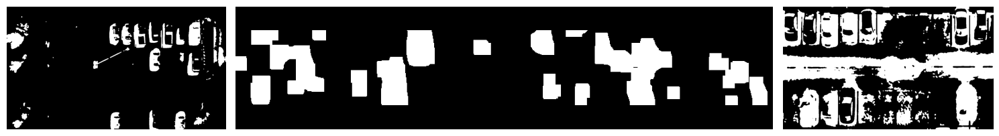

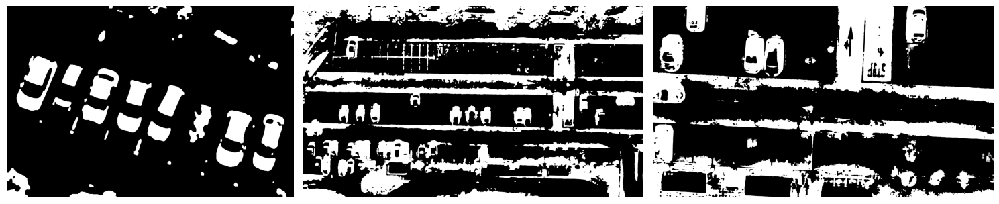

In [10]:
# Function to apply moprpholgy operations (opening, closing, erosion and dilation)
def morph_cars(img_list, close=5, open=5, diff='easy'):
    '''
    Input:
    img_list -> List of binary images
    close -> closing kernel size
    open -> Minimum number of pixels for an object to remain (opening kernel size)
    diff -> distingiushes the difficulty of image set provided
    
    Returns List of images after applying series of morphological operations focused on detecting cars
    '''
    images=[]
    # construct a closing and opening kernel and apply it to the given image
    close_kernel = np.ones((close, close), np.uint8)
    open_kernel = np.ones((open, open), np.uint8)

    for idx,img in enumerate(img_list):
        if diff == 'easy' and idx == 3: 
            erode_kernel = np.ones((10, 10), np.uint8)
            enhanced = cv2.erode(img, erode_kernel, iterations=10)
        elif diff == 'easy' and idx == 0:
            w = 100
            erode_kernel = np.ones((2, 2), np.uint8)
            dilate_kernel = np.ones((15, 15), np.uint8)
            er = cv2.erode(img, erode_kernel, iterations=10)
            enhanced = cv2.dilate(er, dilate_kernel)
            enhanced[:w, :], enhanced[-w:, :], enhanced[:, :w], enhanced[:, -w:] = 0, 0, 0, 0
        elif diff == 'medium' and idx == 1:
            w = 40
            erode_kernel = np.ones((3, 3), np.uint8)
            dilate_kernel = np.ones((20, 20), np.uint8)
            swapped = cv2.subtract(255, img) 
            er = cv2.erode(swapped, erode_kernel, iterations=8)
            enhanced = cv2.dilate(er, dilate_kernel)
            enhanced[:w, :], enhanced[-w:, :] = 0, 0
        else:
            if diff == 'hard' and idx == 0:
                img = cv2.subtract(255, img) 
            close = cv2.morphologyEx(img, cv2.MORPH_CLOSE, close_kernel)
            enhanced = cv2.morphologyEx(img, cv2.MORPH_OPEN, open_kernel)
        images.append(enhanced)

    return images

morphed_images_easy2 = morph_cars(binary_images_easy, 2, 1)
morphed_images_medium2 = morph_cars(binary_images_medium, diff='medium')
morphed_images_hard2 = morph_cars(binary_images_hard, diff='hard')

morphed_images2 = [morphed_images_easy2, morphed_images_medium2, morphed_images_hard2]
plot_images(morphed_images2, True)

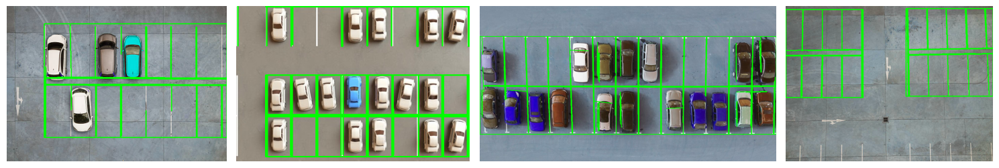

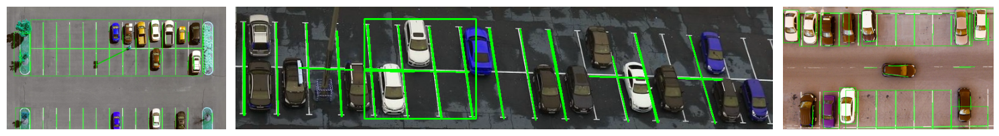

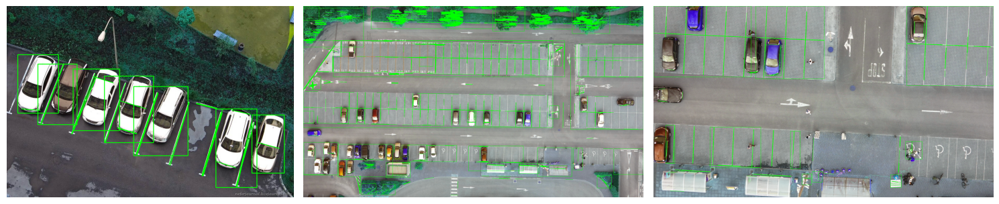

In [11]:
# Function to detect and mark the parking lines and areas 
def detect_and_mark_spots(original_images, processed_images, hough_params=[1, np.pi/180, 200, 70, 10], area_thresh=127):
    
    marked_images = []
    
    for original_img, processed_img in zip(original_images, processed_images):
        raw = original_img.copy()
        
        # Detect lines using Hough Line Transform
        lines = cv2.HoughLinesP(processed_img, 
                                rho=hough_params[0], 
                                theta=hough_params[1], 
                                threshold=hough_params[2], 
                                minLineLength=hough_params[3], 
                                maxLineGap=hough_params[4])

        # Draw the detected lines onto the grid image
        if lines is not None:
            for line in lines:
                x1, y1, x2, y2 = line[0]
                cv2.line(raw, (x1, y1), (x2, y2), (0, 255, 0), 2)

        # Detect contours
        contours, _ = cv2.findContours(processed_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        regions = []
        for contour in contours:
            x, y, w, h = cv2.boundingRect(contour)
            if w > 100 and h > 100:  # Filter out small contours
                roi = original_img[y:y+h, x:x+w]
                mean_color = cv2.mean(roi)[:3]
                color = (0, 255, 0) # Green 

                cv2.rectangle(raw, (x, y), (x+w, y+h), color, 2) 
                
        marked_images.append(raw)
    return marked_images

# Apply the function to mark parking spots
result_images_easy = detect_and_mark_spots(raw_images_easy, morphed_images_easy)
result_images_medium = detect_and_mark_spots(raw_images_medium, morphed_images_medium, hough_params=[1, np.pi/360, 100, 70, 10])
result_images_hard = detect_and_mark_spots(raw_images_hard, morphed_images_hard)

result_images = [result_images_easy, result_images_medium, result_images_hard]
plot_images(result_images, True)

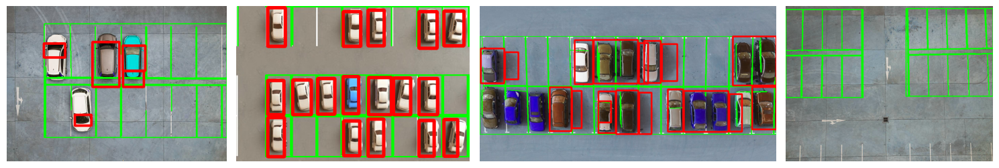

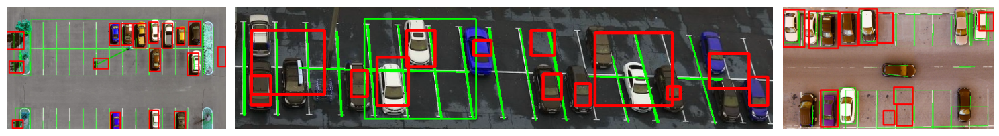

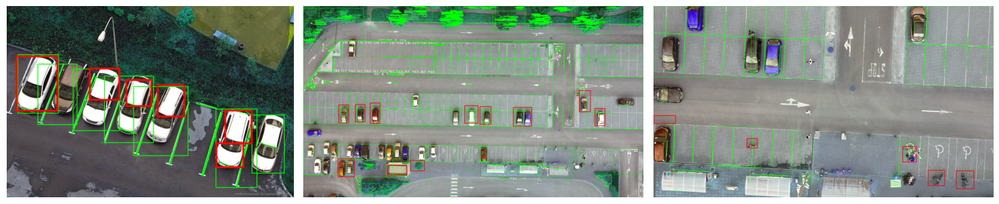

In [12]:
# Function to detect and mark the present cars 
def detect_and_mark_cars(original_images, processed_images, lower=100, upper=255, thickness=5, diff='easy'):
    
    marked_images = []
    i = 0
    
    for original_img, processed_img in zip(original_images, processed_images):

        if diff == 'medium' and i == 1:
            lower = 20
            thickness = 3
        elif diff == 'medium' and i != 1:
            lower = 70
            thickness = 10

        raw = original_img.copy()

        # Edge detection
        edges = cv2.Canny(processed_img, 50, 150)

        # Detect contours
        contours, _ = cv2.findContours(processed_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        regions = []
        for contour in contours:
            x, y, w, h = cv2.boundingRect(contour)
            if w > lower and h > lower and w < upper and h < upper:  # Filter out small contours
                color = (255, 0, 0)  # Red for occupied
                cv2.rectangle(raw, (x, y), (x+w, y+h), color, thickness) 
                
        marked_images.append(raw)
        i += 1
    return marked_images

# Apply the function to mark the cars
result_images_easy2 = detect_and_mark_cars(result_images_easy, morphed_images_easy2, lower=25, upper=200)
result_images_medium2 = detect_and_mark_cars(result_images_medium, morphed_images_medium2, lower=70, diff='medium')
result_images_hard2 = detect_and_mark_cars(result_images_hard, morphed_images_hard2, lower=90, diff='hard')

result_images2 = [result_images_easy2, result_images_medium2, result_images_hard2]
plot_images(result_images2, True)